Capstone Project: 
ALY 6983: Python Tools for Data Science
Signature Assignment

Presented By : Abhay Verma
   
Instructor: Sharat Chikkerur

30th May 2018

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas import DataFrame, Series
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
output_notebook()
%matplotlib inline


Loading BokehJS ...

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.nonparametric.kde import KDEUnivariate
from statsmodels.nonparametric import smoothers_lowess
from patsy import dmatrices
from sklearn import datasets, svm

C:\Users\Abhay\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


### If any one of you wants to download the Kaggle competetion data set and wish to work on it then I have an easy way of getting it and working on it! Advantage of using Kaggle data set is that you will have access to the competetion and if you want to apply Machine learning algorithm then you will need a test data. As states on Kaggle web page, "The test set should be used to see how well your model performs on unseen data. For the test set, we do not provide the ground truth for each passenger. It is your job to predict these outcomes. For each passenger in the test set, use the model you trained to predict whether or not they survived the sinking of the Titanic." https://www.kaggle.com/c/titanic/data



Start with,

import pandas as pd

!pip install --user kaggle
!mkdir C:\Users\Abhay\.kaggle 
#### My user name is Abhay, you will have your own name over there!

!echo {"username":"abhaynverma","key":"789136ad6ebc398b2fdb332a8bb4ac9d"} > ~ /C:\Users\Abhay\.kaggle\kaggle.json

#### TO get a Json file from kaggle, go to your account(If new, then sign up) and click on create new API token. This will download a file valled kaggle.json. You need these credential to access any kaggle dataset for security and valaidation purposes. Open the Json file with Python or iJupytr to know your uername and key and write it in the same format as I have written. 
### Then write 

import kaggle

kaggle.api.competition_download_files('titanic', 'data')

### this will download a local file in your machine reading directly from the source and you are good to go.

# Credit goes to Professor at Norteastern University and  a Data Scientist(Sharat Chikkerur)

In [3]:


import urllib
import requests
result = requests.get('https://github.com/awesomedata/awesome-public-datasets/blob/master/Datasets/titanic.csv.zip?raw=true')

with open('titanic.csv.zip','wb') as fout:
    fout.write(result.content)

from zipfile import ZipFile
zf = ZipFile('./titanic.csv.zip')
zf.extract('titanic.csv')
#Credit goes to Professor and Data Scientist(Sharat Chikkerur)



'C:\\Users\\Abhay\\titanic.csv'

In [4]:
df = pd.read_csv('titanic.csv')
df.head()





,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


### Data
The dataset used in this project is included as titanic_data.csv. This dataset is provided by Udacity and contains the following attributes:

survival ? Survival (0 = No; 1 = Yes)
pclass ? Passenger Class (1 = 1st; 2 = 2nd; 3 = 3rd)
name ? Name
sex ? Sex
age ? Age
sibsp ? Number of Siblings/Spouses Aboard
parch ? Number of Parents/Children Aboard
ticket ? Ticket Number
fare ? Passenger Fare
cabin ? Cabin
embarked ? Port of Embarkation (C = Cherbourg; Q = Queenstown; S = Southampton)

In [5]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
PassengerId    891 non-null int64
Survived       891 non-null int64
Pclass         891 non-null int64
Name           891 non-null object
Sex            891 non-null object
Age            714 non-null float64
SibSp          891 non-null int64
Parch          891 non-null int64
Ticket         891 non-null object
Fare           891 non-null float64
Cabin          204 non-null object
Embarked       889 non-null object
dtypes: float64(2), int64(5), object(5)
memory usage: 83.6+ KB


In [7]:
print(df.shape)

(891, 12)


In [8]:
#CLEANING


In [9]:
#there are NaN values, we will hae to fix this
# cabin column is having most of the NAN values, lets get rid of this first

In [10]:
df.isna()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,False,False,False,False,False,False,False,False,False,False,True,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,True,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,True,False
5,False,False,False,False,False,True,False,False,False,False,True,False
6,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,True,False
8,False,False,False,False,False,False,False,False,False,False,True,False
9,False,False,False,False,False,False,False,False,False,False,True,False


In [11]:
df.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [12]:
#the df.isna().sum() functio shows that 177 values are missing in the Age column.
# two-possible solutions to deal with age variable 
#1.remove all the na values and work with rest of the data or replace the missing values with the median or mean age value to get a better result
# I am replacing Age's NaN values with median value as it is a better solution to deal with outliners(NaN values)
#let's use the describe function as it generates descriptive statistics that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.


df.describe()




,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [13]:
#replacing NaN values with median

df['Age'] = df['Age'].fillna(df['Age'].median())

In [14]:
df.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.361582,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,13.019697,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [15]:
#cabin has 687 missing values, no sense in keeping the values 
df = df.drop(['Cabin'], axis=1)


In [16]:
# ticket colmn is also messed up as there is no 'ONE Type of data type' in that column. I will get remove this as well

In [17]:
df = df.drop(['Ticket'], axis=1)

# Remove NaN values which are left
df = df.dropna() 



In [18]:
#ensuring no null values
df.isna().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Fare           0
Embarked       0
dtype: int64

In [19]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,8.0500,S
5,6,0,3,"Moran, Mr. James",male,28.0,0,0,8.4583,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,51.8625,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,21.0750,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,11.1333,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,30.0708,C


In [20]:
# let us visualize it a bit to understand

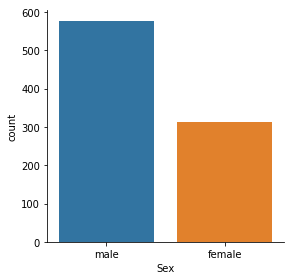

In [21]:
sns.factorplot('Sex',data=df,kind='count')


In [22]:
df[df['Sex']=='male'].count()

PassengerId    577
Survived       577
Pclass         577
Name           577
Sex            577
Age            577
SibSp          577
Parch          577
Fare           577
Embarked       577
dtype: int64

In [23]:
df[df['Sex']=='female'].count()

PassengerId    312
Survived       312
Pclass         312
Name           312
Sex            312
Age            312
SibSp          312
Parch          312
Fare           312
Embarked       312
dtype: int64

Text(0.5,1,'Distribution of Survival, (1 = Survived, 0=Dead) in TOTAL')

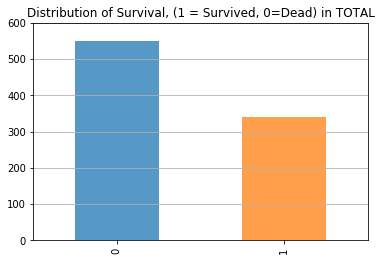

In [24]:

alpha_bar_chart = 0.75 #color translucent 
ax1 = plt.subplot()
# plots a bar graph of those who surived vs those who did not in TOTAL

df.Survived.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
plt.grid(b=True, which='major', axis='y')  
ax1.set_ylim(0, 600)


# puts a title on our graph
plt.title("Distribution of Survival, (1 = Survived, 0=Dead) in TOTAL")    

In [25]:
df['Died'] = 1 - df['Survived']

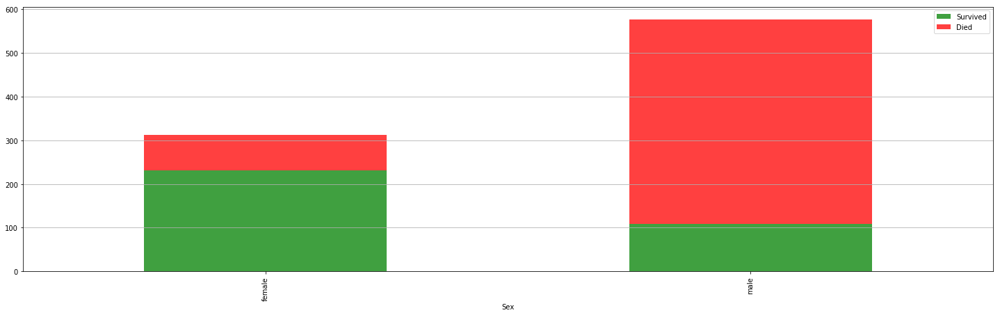

In [26]:
alpha_bar_chart = 0.75 #color translucent
df.groupby('Sex').agg('sum')[['Survived', 'Died']].plot(kind='bar',alpha=alpha_bar_chart, figsize=(25, 7), stacked=True, color=['g', 'r']);
plt.grid(b=True, which='major', axis='y')  #If dont want grid lines, please remove this line of code for neat visualization
#It is visible that male are way more dead than female in all

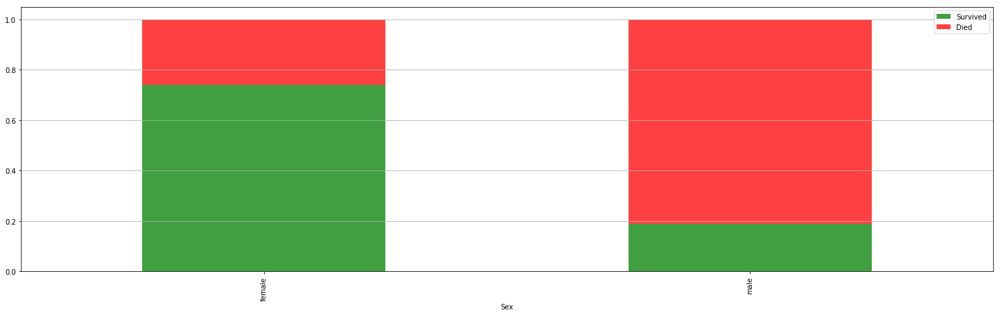

In [27]:
# Ratio wise as well we are getting similar result, i.e. More Female
df.groupby('Sex').agg('mean')[['Survived', 'Died']].plot(kind='bar',alpha=alpha_bar_chart, figsize=(25, 7), stacked=True, color=['g', 'r']);
plt.grid(b=True, which='major', axis='y') #If dont want grid lines, please remove this line of code for neat visualization

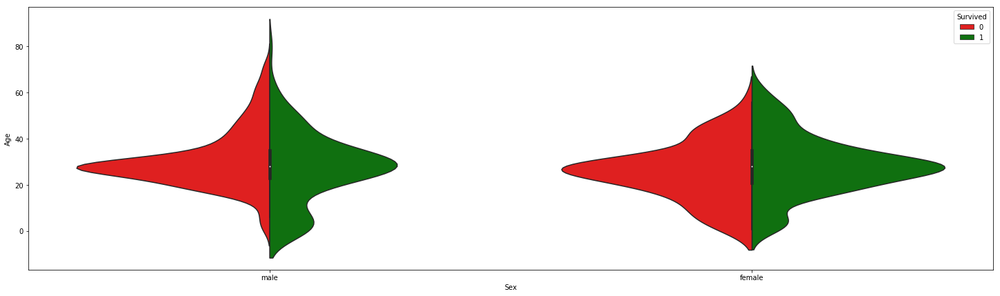

In [28]:
# connecting the survival variable with the age variable with a Violin plot
fig = plt.figure(figsize=(25, 7))
sns.violinplot(x='Sex', y='Age', 
               hue='Survived', data=df, 
               split=True,
               palette={0: "r", 1: "g"}
              );


we can see mixed outcomes in the violin plot

1.Younger male tend to survive
2.A large number of passengers between 0 and 40 succumb
3.The age doesn't seem to have a direct impact on the female survival
Lets visualize other parameters

C:\Users\Abhay\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:52: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


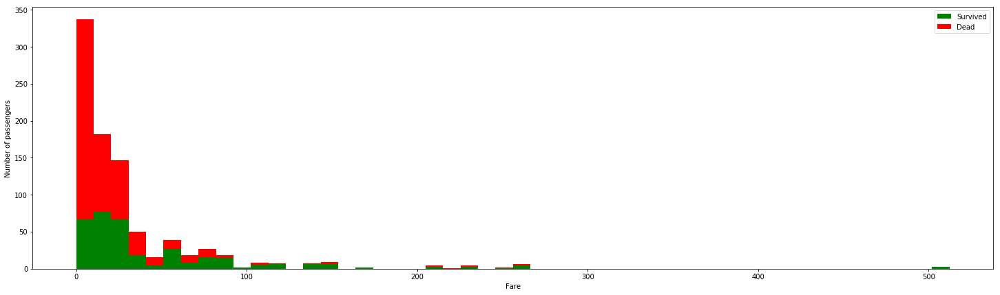

In [29]:
# Fare ticket(each passenger) Vs Survival!

figure = plt.figure(figsize=(25, 7))
plt.hist([df[df['Survived'] == 1]['Fare'], df[df['Survived'] == 0]['Fare']], 
         stacked=True, color = ['g','r'],
         bins = 50, label = ['Survived','Dead'])
plt.xlabel('Fare')
plt.ylabel('Number of passengers')
plt.legend();


Cheap ticket passangers were given no importance, obviously! 
expensive tickets holder'were rescued first

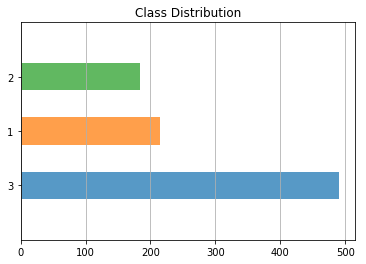

In [30]:
ax2 = plt.subplot()
df.Pclass.value_counts().plot(kind="barh", alpha=alpha_bar_chart)
ax2.set_ylim(-1, len(df.Pclass.value_counts()))
plt.title("Class Distribution")
plt.grid(b=True, which='major', axis='x') ##If dont want grid lines, please remove this line of code for neat visualization

In [31]:
# specifies the parameters of our graphs
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
alpha_bar_chart = 0.55

plt.subplot()
# plots a kernel density estimate of the subset of the 1st class passangers's age
df.Age[df.Pclass == 1].plot(kind='kde')    
df.Age[df.Pclass == 2].plot(kind='kde')
df.Age[df.Pclass == 3].plot(kind='kde')
 # plots an axis lable
plt.xlabel("Age")    
plt.title("Age Distribution within classes")
# sets our legend for our graph.
plt.legend(('1st Class', '2nd Class','3rd Class'),loc='best') 



### if you take a look at the average of the ages, the third class passangers are younger and instead the first class passengers are older it's sort of like there was some sort of relationship with how much money people had with the type of tickets they could buy. It's a good way of trying to make sense out of information.

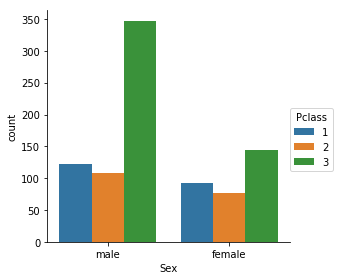

In [32]:
#Class Distribution Gender wise
sns.factorplot('Sex',data=df,kind='count',hue='Pclass')

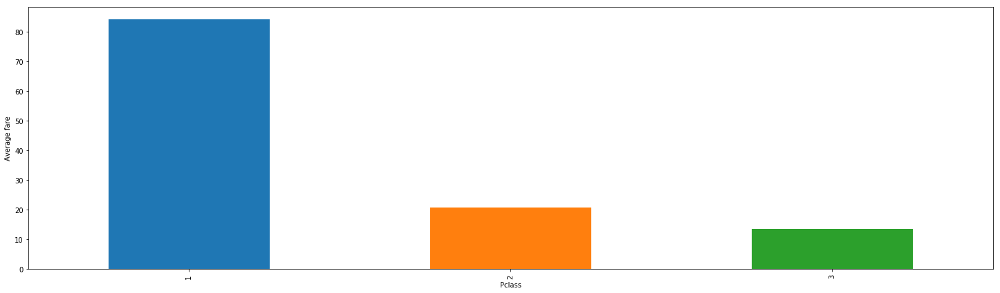

In [33]:
#  ticket fare vs class

ax = plt.subplot()
ax.set_ylabel('Average fare')
df.groupby('Pclass').mean()['Fare'].plot(kind='bar', figsize=(25, 7), ax = ax);

#### As obvios, 1st class is way too expensive, and the gap also is very huge from the other 2 classes. The thing to notice is that 2nd class and 3rd class dont have a such a big gap.

Text(0.5,1,'Passengers per boarding location')

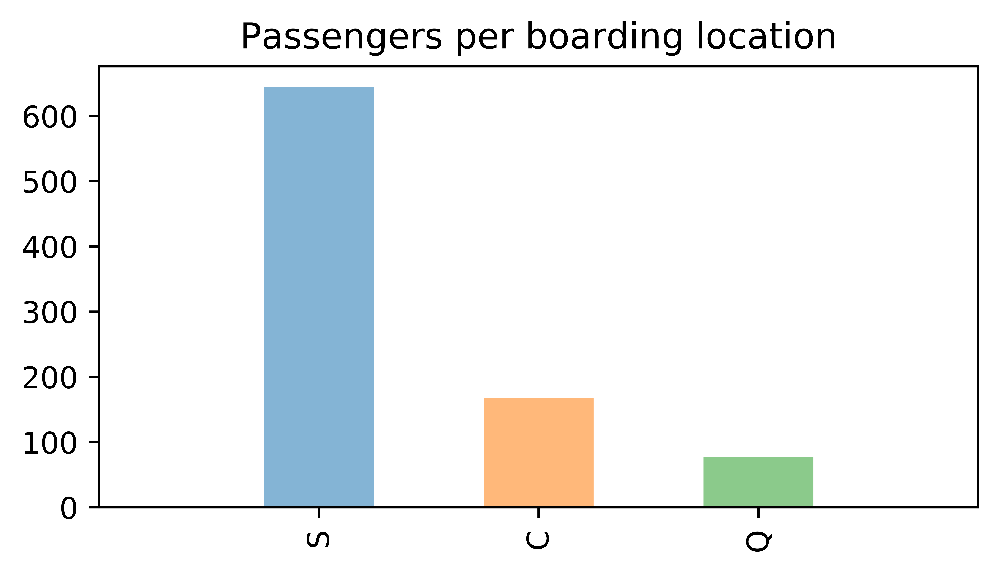

In [34]:
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
alpha_bar_chart = 0.55

ax = plt.subplot2grid((2,3),(0,0))
df.Embarked.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
ax.set_xlim(-1, len(df.Embarked.value_counts()))

plt.title("Passengers per boarding location")

In [ ]:
# Port of Embarkation (C = Cherbourg; Q = Queenstown; S = Southampton)

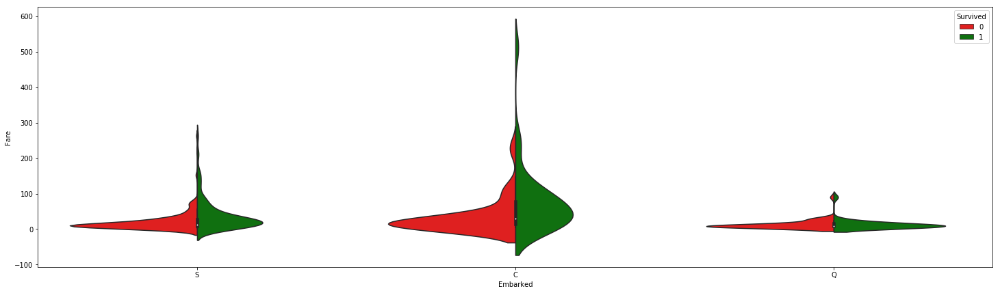

In [35]:
#Let's now see how the embarkation site affects the survival.

fig = plt.figure(figsize=(25, 7))
sns.violinplot(x='Embarked', y='Fare', hue='Survived', data=df, split=True, palette={0: "r", 1: "g"});

As seen from the violin plot, embarkation C, S, Q have similar results
1. broad range of fare tickets 
2. passengers who pay the highest prices are those who survive.


### To Summarise and Simplify what we have done so far, please look at the graphs down below :)

In [37]:
#To Summarise
fig = plt.figure(figsize=(18,12), dpi=1600)
a = 0.65
# Step 1
ax1 = fig.add_subplot(341)
df.Survived.value_counts().plot(kind='bar', color="blue", alpha=a)
ax1.set_xlim(-1, len(df.Survived.value_counts()))
plt.title("Step. 1")

# Step 2
ax2 = fig.add_subplot(345)
df.Survived[df.Sex == 'male'].value_counts().plot(kind='bar',label='Male')
df.Survived[df.Sex == 'female'].value_counts().plot(kind='bar', color='#FA2379',label='Female')
ax2.set_xlim(-1, 2)
plt.title("Step. 2 \nWho Survived? with respect to Gender."); plt.legend(loc='best')

ax3 = fig.add_subplot(346)
(df.Survived[df.Sex == 'male'].value_counts()/float(df.Sex[df.Sex == 'male'].size)).plot(kind='bar',label='Male')
(df.Survived[df.Sex == 'female'].value_counts()/float(df.Sex[df.Sex == 'female'].size)).plot(kind='bar', color='#FA2379',label='Female')
ax3.set_xlim(-1,2)
plt.title("Who Survied proportionally?"); plt.legend(loc='best')


# Step 3
ax4 = fig.add_subplot(349)
female_highclass = df.Survived[df.Sex == 'female'][df.Pclass != 3].value_counts()
female_highclass.plot(kind='bar', label='female highclass', color='#FA2479', alpha=a)
ax4.set_xticklabels(["Survived", "Died"], rotation=0)
ax4.set_xlim(-1, len(female_highclass))
plt.title("Who Survived? with respect to Gender and Class"); plt.legend(loc='best')

ax5 = fig.add_subplot(3,4,10, sharey=ax1)
female_lowclass = df.Survived[df.Sex == 'female'][df.Pclass == 3].value_counts()
female_lowclass.plot(kind='bar', label='female, low class', color='pink', alpha=a)
ax5.set_xticklabels(["Died","Survived"], rotation=0)
ax5.set_xlim(-1, len(female_lowclass))
plt.legend(loc='best')

ax6 = fig.add_subplot(3,4,11, sharey=ax1)
male_lowclass = df.Survived[df.Sex == 'male'][df.Pclass == 3].value_counts()
male_lowclass.plot(kind='bar', label='male, low class',color='lightblue', alpha=a)
ax6.set_xticklabels(["Died","Survived"], rotation=0)
ax6.set_xlim(-1, len(male_lowclass))
plt.legend(loc='best')

ax7 = fig.add_subplot(3,4,12, sharey=ax1)
male_highclass = df.Survived[df.Sex == 'male'][df.Pclass != 3].value_counts()
male_highclass.plot(kind='bar', label='male highclass', alpha=a, color='steelblue')
ax7.set_xticklabels(["Died","Survived"], rotation=0)
ax7.set_xlim(-1, len(male_highclass))
plt.legend(loc='best')

# Lets pull up our socks and get going..... Starting with Regression Model

In [74]:
!python -m pip install --user numpy scipy matplotlib ipython jupyter pandas sympy nose


In [121]:
from scipy import stats
stats.chisqprob = lambda chisq, df: stats.chi2.sf(chisq, df)

# Now that we have a basic understanding of what we are trying to predict, let’s predict it.

Logistic Regression
As explained by Wikipedia:
>In statistics, logistic regression or logit regression is a type of regression analysis used for predicting the outcome of a categorical dependent variable (a dependent variable that can take on a limited number of values, whose magnitudes are not meaningful but whose ordering of magnitudes may or may not be meaningful) based on one or more predictor variables. That is, it is used in estimating empirical values of the parameters in a qualitative response model. The probabilities describing the possible outcomes of a single trial are modeled, as a function of the explanatory (predictor) variables, using a logistic function. Frequently (and subsequently in this article) "logistic regression" is used to refer specifically to the problem in which the dependent variable is binary—that is, the number of available categories is two—and problems with more than two categories are referred to as multinomial logistic regression or, if the multiple categories are ordered, as ordered logistic regression.
Logistic regression measures the relationship between a categorical dependent variable and one or more independent variables, which are usually (but not necessarily) continuous, by using probability scores as the predicted values of the dependent variable. As such it treats the same set of problems as does probit regression using similar techniques.

#### So I will try to explain what and how we are going to proceed further
The aim here is to predict a binary outcomes. That is, it wants to know whether some will die, (represented as a 0), or survive, (represented as 1). A good place to start is to calculate the probability that an individual observation, or person, is likely to be a 0 or 1. That way we would know the chance that someone survives, and could start making somewhat informed predictions. If we did, we'd get results like this:: 

(https://raw.github.com/agconti/kaggle-titanic/master/images/calc_prob.png) 

(*Y axis is the probability that someone survives, X axis is the passenger’s number from 1 to 891.*)

While that information is useful it doesn’t let us know whether someone ended up alive or dead. It just lets us know the chance that they will survive or die. We still need to translate these probabilities into the binary decision we’re looking for. But how? We could arbitrarily say that our survival cutoff is anyone with a probability of survival over 50%. In fact, this tactic would actually perform pretty well for our data and would allow you to make decently accurate predictions. Graphically it would look something like this:

(https://raw.github.com/agconti/kaggle-titanic/master/images/calc_prob_wline.png)


A logistic regression follows the all steps we took above but mathematically calculates the cutoff, or decision boundary. This way it can figure out the best cut off to choose, perhaps 50% or 51.84%, that most accurately represents the training data.

The three cells below show the process of creating our Logitist regression model, training it on the data, and examining its performance. 

First, we define our formula for our Logit regression. In the next cell we create a regression friendly dataframe that sets up boolean values for the categorical variables in our formula and lets our regression model know the types of inputs we're giving it. The model is then instantiated and fitted before a summary of the model's performance is printed. In the last cell we graphically compare the predictions of our model to the actual values we are trying to predict, as well as the residual errors from our model to check for any structure we may have missed.

In [141]:
# here the ~ sign is an = sign, and the features of our dataset 
# are written as a formula to predict survived. The C() lets our 
# regression know that those variables are categorical.
# Ref: http://patsy.readthedocs.org/en/latest/formulas.html
formula = 'Survived ~ C(Pclass) + C(Sex) + Age + SibSp  + C(Embarked)' 
# create a results dictionary to hold our regression results for easy analysis later        
results = {} 

In [142]:
# create a regression friendly dataframe using patsy's dmatrices function
y,x = dmatrices(formula, data=df, return_type='dataframe')

# instantiate our model
model = sm.Logit(y,x)

# fit our model to the training data
res = model.fit()

# save the result for outputing predictions later
results['Logit'] = [res, formula]
res.summary()

Optimization terminated successfully.
         Current function value: 0.441904
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               Survived   No. Observations:                  889
Model:                          Logit   Df Residuals:                      881
Method:                           MLE   Df Model:                            7
Date:                Sat, 19 May 2018   Pseudo R-squ.:                  0.3357
Time:                        19:24:33   Log-Likelihood:                -392.85
converged:                       True   LL-Null:                       -591.41
                                        LLR p-value:                 9.926e-82
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.2201      0.419     10.078      0.000       3.399       5.041
C(Pclass)[T.2]      -1.0300      0.270     -3.818      0.000      -1.559      -0.501
C(Pclass)[T.3]      -2.2939      0.255     -9.007      0.000      -2.793      -1.795
C(Sex)[T.male]      -2.6905      0.196    -13.754      0.000      -3.074      -2.307
C(Embarked)[T.Q]    -0.0578      0.378     -0.153      0.878      -0.798       0.683
C(Embarked)[T.S]    -0.4736      0.236     -2.006      0.045      -0.936      -0.011
Age                 -0.0390      0.008     -4.974      0.000      -0.054      -0.024
SibSp               -0.3256      0.104     -3.144      0.002      -0.529      -0.123
====================================================================================
"""

C:\Users\Abhay\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:106: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


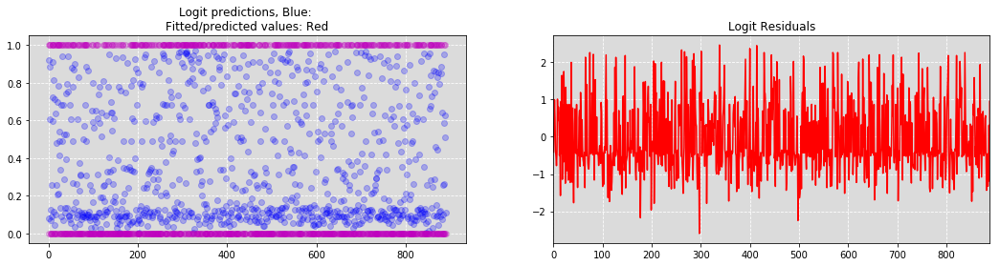

In [124]:
# Plot Predictions Vs Actual
plt.figure(figsize=(18,4));
plt.subplot(121, axisbg="#DBDBDB")
# generate predictions from our fitted model
ypred = res.predict(x)
plt.plot(x.index, ypred, 'bo', x.index, y, 'mo', alpha=.25);
plt.grid(color='white', linestyle='dashed')
plt.title('Logit predictions, Blue: \nFitted/predicted values: Red');

# Residuals
ax2 = plt.subplot(122, axisbg="#DBDBDB")
plt.plot(res.resid_dev, 'r-')
plt.grid(color='white', linestyle='dashed')
ax2.set_xlim(-1, len(res.resid_dev))
plt.title('Logit Residuals');

#### So how well did this work ?
### Lets look at the predictions we generated graphically:

In [125]:
fig = plt.figure(figsize=(18,9), dpi=1600)
a = .2

# Below are examples of more advanced plotting. 
# It it looks strange check out the tutorial above.
fig.add_subplot(221, axisbg="#DBDBDB")
kde_res = KDEUnivariate(res.predict())
kde_res.fit()
plt.plot(kde_res.support,kde_res.density)
plt.fill_between(kde_res.support,kde_res.density, alpha=a)
plt.title("Distribution of our Predictions")

fig.add_subplot(222, axisbg="#DBDBDB")
plt.scatter(res.predict(),x['C(Sex)[T.male]'] , alpha=a)
plt.grid(b=True, which='major', axis='x')
plt.xlabel("Predicted chance of survival")
plt.ylabel("Gender Bool")
plt.title("The Change of Survival Probability by Gender (1 = Male)")

fig.add_subplot(223, axisbg="#DBDBDB")
plt.scatter(res.predict(),x['C(Pclass)[T.3]'] , alpha=a)
plt.xlabel("Predicted chance of survival")
plt.ylabel("Class Bool")
plt.grid(b=True, which='
         major', axis='x')
plt.title("The Change of Survival Probability by Lower Class (1 = 3rd Class)")

fig.add_subplot(224, axisbg="#DBDBDB")
plt.scatter(res.predict(),x.Age , alpha=a)
plt.grid(True, linewidth=0.15)
plt.title("The Change of Survival Probability by Age")
plt.xlabel("Predicted chance of survival")
plt.ylabel("Age")

C:\Users\Abhay\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:106: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Text(0,0.5,'Age')

### Next thing - you can use your current model and use a model on which you can test whatever you have done so far. In tht data set your survived column would be left empty and your machie learning formula will predict hose values.

###  Use your model to make prediction on our test set by Creating an acceptable formula for you machine learning algorithms
### For a better predictin, you can clean the data more refinely and add new column variable to the data set to break the data further into small groups to find corelations.

#### For example you can clean and use the Name Column in a better way, how?
#### As the Name column is currently not being used, but we can at least extract the title from the name. 
#### you can reduce them all to Mrs, Miss, Mr and Master and sort them out.  you can do this by using function substrings using 'strings' Library. 

Credidts: 
Shout to My Professor and Data Scientist(Sharat Chikkerur) at Norteastern University.

Reference:

https://www.kaggle.com/c/titanic/data
https://github.com/awesomedata/awesome-public-datasets/blob/master/Datasets/
MENSHAWY, A. (2018). DEEP LEARNING BY EXAMPLE: A hands-on guide to implementing advanced machine learning... algorithms and neural networks. S.l.: PACKT PUBLISHING LIMITED.
https://www.youtube.com/watch?v=fS70iptz-XU&t=815s
